In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
df = pd.read_csv('labor.csv')

In [3]:
columns_to_keep = ['Title', 'Publication Year', 'Publication Type', 'Source Title', 'Abstract',
                   'Fields of Study', 'Citing Patents Count', 'Citing Works Count']
df = df[columns_to_keep]
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8879 entries, 0 to 8878
Data columns (total 8 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Title                 8879 non-null   object 
 1   Publication Year      8874 non-null   float64
 2   Publication Type      8879 non-null   object 
 3   Source Title          8879 non-null   object 
 4   Abstract              7186 non-null   object 
 5   Fields of Study       7767 non-null   object 
 6   Citing Patents Count  8879 non-null   int64  
 7   Citing Works Count    8879 non-null   int64  
dtypes: float64(1), int64(2), object(5)
memory usage: 555.1+ KB


In [4]:
df = df.dropna()
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 6875 entries, 0 to 8875
Data columns (total 8 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Title                 6875 non-null   object 
 1   Publication Year      6875 non-null   float64
 2   Publication Type      6875 non-null   object 
 3   Source Title          6875 non-null   object 
 4   Abstract              6875 non-null   object 
 5   Fields of Study       6875 non-null   object 
 6   Citing Patents Count  6875 non-null   int64  
 7   Citing Works Count    6875 non-null   int64  
dtypes: float64(1), int64(2), object(5)
memory usage: 483.4+ KB


In [5]:
#df = df[df["Citing Patents Count"] == 0]

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 6875 entries, 0 to 8875
Data columns (total 8 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Title                 6875 non-null   object 
 1   Publication Year      6875 non-null   float64
 2   Publication Type      6875 non-null   object 
 3   Source Title          6875 non-null   object 
 4   Abstract              6875 non-null   object 
 5   Fields of Study       6875 non-null   object 
 6   Citing Patents Count  6875 non-null   int64  
 7   Citing Works Count    6875 non-null   int64  
dtypes: float64(1), int64(2), object(5)
memory usage: 483.4+ KB


In [7]:
df["Publication Year"] = df["Publication Year"].values.astype(int)
# Introducing temporal ordering
#df["Publication Year"] = pd.to_datetime(df["Publication Year"])
df = df.sort_values(by="Publication Year")

In [8]:
df = df.drop(df[(df['Abstract'] == 'n/') | (df['Abstract'] == "")].index)

In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 6870 entries, 2807 to 4508
Data columns (total 8 columns):
 #   Column                Non-Null Count  Dtype 
---  ------                --------------  ----- 
 0   Title                 6870 non-null   object
 1   Publication Year      6870 non-null   int32 
 2   Publication Type      6870 non-null   object
 3   Source Title          6870 non-null   object
 4   Abstract              6870 non-null   object
 5   Fields of Study       6870 non-null   object
 6   Citing Patents Count  6870 non-null   int64 
 7   Citing Works Count    6870 non-null   int64 
dtypes: int32(1), int64(2), object(5)
memory usage: 456.2+ KB


In [10]:
pd.set_option('display.max_rows', df.shape[0]+1)
pd.set_option('display.max_columns',df.shape[1]+1)
pd.set_option('display.width', 1000)
pd.set_option('display.max_colwidth', None)

In [11]:
interesting_years = [1911, 1912, 1916, 1918, 1919, 1920,
       1921, 1922, 1924, 1925, 1926, 1927, 1928, 1929, 1930, 1931,
       1932, 1933, 1934, 1935, 1936, 1937, 1938, 1939, 1940, 1941, 1942,
       1943, 1944, 1945, 1946, 1947, 1948, 1949, 1950, 1951, 1952, 1953,
       1954, 1955, 1956, 1957, 1958, 1959, 1960, 1961, 1962, 1963, 1964,
       1965, 1966, 1967, 1968, 1969, 1970, 1971, 1972, 1973, 1974, 1975,
       1976, 1977, 1978, 1979, 1980, 1981, 1982, 1983, 1984, 1985, 1986,
       1987, 1988, 1989, 1990, 1991, 1992, 1993, 1994, 1995, 1996, 1997,
       1998, 1999, 2000, 2001, 2002, 2003, 2004, 2005, 2006, 2007, 2008,
       2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019,
       2020, 2021]
interesting_years.sort()

In [12]:
len(interesting_years)

106

Text(0, 0.5, 'Number of Papers')

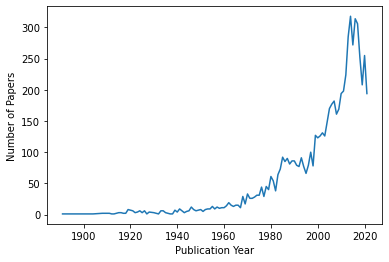

In [13]:
ax = df.groupby('Publication Year').count()['Title'].plot()
ax.set_xlabel("Publication Year")
ax.set_ylabel("Number of Papers")

<AxesSubplot:xlabel='Publication Year'>

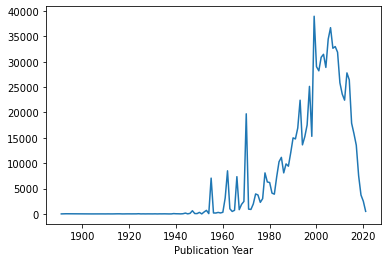

In [14]:
df.groupby('Publication Year').sum()['Citing Works Count'].plot()

In [15]:
import heapq
import re # regular expressions
import nltk
import string
nltk.download('punkt')
nltk.download('stopwords')
stopwords = nltk.corpus.stopwords.words('english')

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\carus\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\carus\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [16]:
def preprocess(text):
    formatted_text = text.lower()
    tokens = []
    for token in nltk.word_tokenize(formatted_text):
        tokens.append(token)
    
    #print(tokens)
    tokens = [word for word in tokens if word not in stopwords and word not in string.punctuation]
    formatted_text = ' '.join(element for element in tokens)
    return formatted_text

In [17]:
df["Abstract"] = df["Abstract"].apply(preprocess)

In [18]:
counts = df.groupby('Publication Year').count()['Title'].values
place_holder = [None]*(len(counts)+1)
place_holder[0] = 0
for i in range(1,len(counts)+1):
    place_holder[i] = place_holder[i-1] + counts[i-1]

In [19]:
len(counts)

114

In [20]:
len(df['Publication Year'].unique())

114

In [21]:
df = df.drop(df[(df['Abstract'] == 'n/') | (df['Abstract'] == "")].index)

In [22]:
df[(df['Abstract'] == 'n/') | (df['Abstract'] == "")].index

Int64Index([], dtype='int64')

In [23]:
df['Publication Year'].unique()

array([1891, 1893, 1904, 1908, 1909, 1910, 1911, 1912, 1913, 1915, 1916,
       1917, 1918, 1919, 1920, 1921, 1922, 1923, 1924, 1925, 1926, 1927,
       1928, 1930, 1931, 1932, 1933, 1934, 1935, 1937, 1938, 1939, 1940,
       1941, 1942, 1943, 1944, 1945, 1946, 1947, 1948, 1949, 1950, 1951,
       1952, 1953, 1954, 1955, 1956, 1957, 1958, 1959, 1960, 1961, 1962,
       1963, 1964, 1965, 1966, 1967, 1968, 1969, 1970, 1971, 1972, 1973,
       1974, 1975, 1976, 1977, 1978, 1979, 1980, 1981, 1982, 1983, 1984,
       1985, 1986, 1987, 1988, 1989, 1990, 1991, 1992, 1993, 1994, 1995,
       1996, 1997, 1998, 1999, 2000, 2001, 2002, 2003, 2004, 2005, 2006,
       2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017,
       2018, 2019, 2020, 2021])

In [24]:
df['Publication Year'].value_counts() 

2014    318
2016    314
2017    306
2013    285
2015    272
2020    255
2018    252
2012    224
2019    208
2011    198
2010    194
2021    194
2007    182
2006    177
2005    170
2009    169
2008    161
2004    148
2002    131
1999    127
2001    126
2003    126
2000    123
1997    100
1985     92
1993     91
1987     90
1989     86
1990     86
1986     85
1988     81
1996     79
1991     79
1998     78
1992     77
1994     77
1984     73
1995     66
1983     64
1980     61
1981     54
1978     45
1976     44
1979     40
1982     38
1970     33
1974     31
1975     31
1977     29
1968     29
1973     28
1972     26
1971     26
1962     19
1969     17
1963     15
1965     15
1966     15
1961     14
1955     13
1964     13
1946     12
1957     12
1967     11
1960     11
1959     11
1958     10
1953      9
1956      9
1941      9
1954      9
1950      8
1919      8
1952      8
1947      8
1949      7
1920      7
1939      7
1945      6
1926      6
1934      6
1933      6
1921      6
1924

In [25]:
interesting_years = [1908, 1909, 1910, 1911, 1915, 1916,
       1917, 1918, 1919, 1920, 1921, 1922, 1923, 1924, 1925, 1926,
       1928, 1930, 1931, 1933, 1934, 1935, 1939, 1940,
       1941, 1942, 1943, 1944, 1945, 1946, 1947, 1948, 1949, 1950, 1951,
       1952, 1953, 1954, 1955, 1956, 1957, 1958, 1959, 1960, 1961, 1962,
       1963, 1964, 1965, 1966, 1967, 1968, 1969, 1970, 1971, 1972, 1973,
       1974, 1975, 1976, 1977, 1978, 1979, 1980, 1981, 1982, 1983, 1984,
       1985, 1986, 1987, 1988, 1989, 1990, 1991, 1992, 1993, 1994, 1995,
       1996, 1997, 1998, 1999, 2000, 2001, 2002, 2003, 2004, 2005, 2006,
       2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017,
       2018, 2019, 2020, 2021]
interesting_years.sort()

In [64]:
recent_years = [2000, 2001, 2002, 2003, 2004, 2005, 2006, 2007, 2008,
               2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019, 2020]
df_recent = df[df['Publication Year'].isin(recent_years)]

In [65]:
percentage_high = 0.95
percentage_low = 0.015 # 1% or 1.5% is probably better

In [66]:
# Applying TFIDF to titles
#You can still get n-grams here
vectorizer_abstracts = TfidfVectorizer(ngram_range = (2, 2), max_df = percentage_high, min_df = percentage_low)
abstracts_tfidf = vectorizer_abstracts.fit_transform(df_recent["Abstract"])
scores = (abstracts_tfidf.toarray())
#print("\n\nScores : \n", scores)

In [67]:
tf_idf_abstracts = pd.DataFrame(data=abstracts_tfidf.toarray(),columns=vectorizer_abstracts.get_feature_names())
tf_idf_abstracts.shape

(4339, 58)

In [68]:
tf_idf_abstracts.columns

Index(['abstract paper', 'across countries', 'also find', 'also show', 'business cycle', 'capital accumulation', 'capital labor', 'cross country', 'data set', 'developing countries', 'economic growth', 'empirical evidence', 'equilibrium model', 'et al', 'find evidence', 'firm level', 'force participation', 'general equilibrium', 'growth model', 'human capital', 'income tax', 'job search', 'labor demand', 'labor force', 'labor income', 'labor market', 'labor markets', 'labor productivity', 'labor supply', 'level data', 'life cycle', 'long run', 'long term', 'market outcomes', 'model labor', 'monetary policy', 'open economy', 'panel data', 'paper analyzes', 'paper develops', 'paper examines', 'paper investigates', 'paper provides', 'paper studies', 'per capita', 'percentage points', 'results indicate', 'results show', 'results suggest', 'short run', 'skilled labor', 'skilled workers', 'social security', 'tax rate', 'tax rates', 'united states', 'using data', 'wage inequality'], dtype='ob



Most relevant bi-grams 
                     term        rank
26         labor markets  520.767742
29            level data  259.572596
56     unemployment rate  183.070441
20            job search  159.227291
1              also find  158.811436
27    labor productivity  144.767410
32             long term  133.439894
24          labor income  124.680471
18            income tax  107.878676
57         united states  105.551271
28          labor supply   89.145582
25          labor market   87.297343
5          cross section   86.671708
49             short run   85.723390
38        paper develops   83.550783
13   force participation   82.883864
44     percentage points   80.125965
33       market outcomes   76.214377
46      results indicate   70.204456
34           model labor   70.087397
11         find evidence   68.092529
31              long run   67.497571
41        paper presents   66.286001
12            firm level   66.102171
23           labor force   63.995427
15         

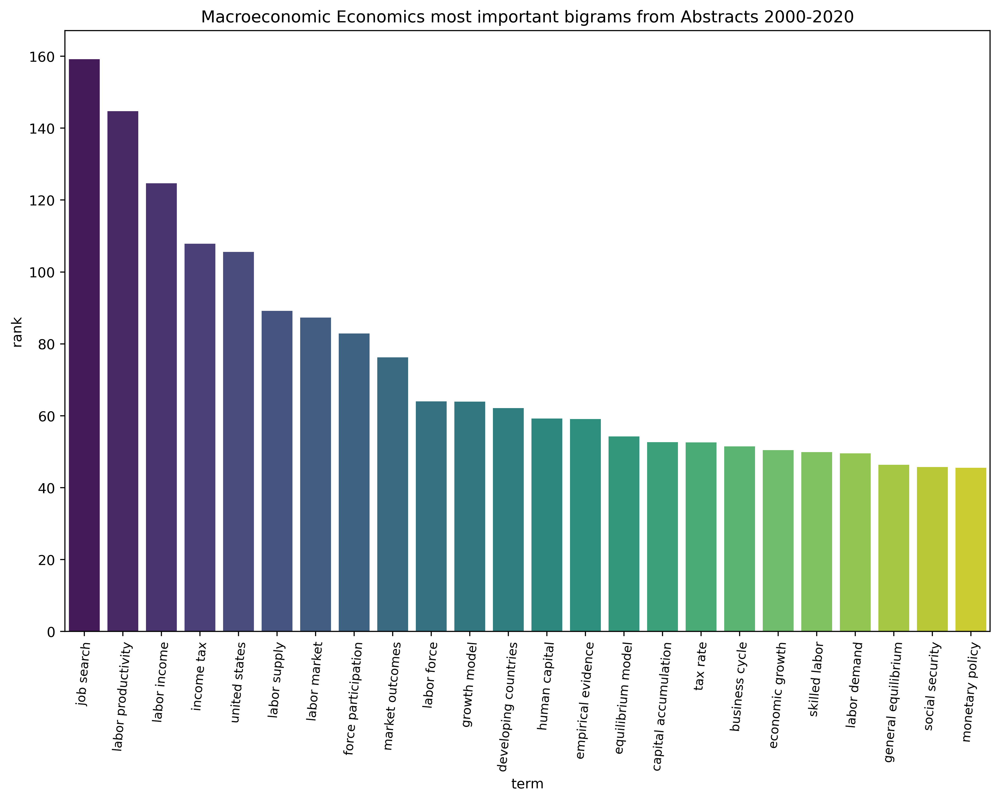

In [70]:
 # Getting top ranking features
sums = abstracts_tfidf.sum(axis = 0)
data1 = []
for col, term in enumerate(features_abstracts):
    data1.append((term, sums[0, col-1]))
ranking = pd.DataFrame(data1, columns = ['term', 'rank'])
words = (ranking.sort_values('rank', ascending = False))
print("\n\nMost relevant bi-grams \n", words.head(50))
plt.figure(figsize=(12,8), dpi=400)
sns.barplot(x="term", y="rank", data=ranking.loc[ranking['term'].isin(['business cycle', 'capital accumulation', 
'developing countries', 'economic growth', 'empirical evidence', 'equilibrium model',
'force participation', 'general equilibrium', 'growth model', 
'human capital', 'income tax', 'job search', 'labor demand', 'labor force', 'labor income',
'labor market', 'labor productivity', 'labor supply', 'market outcomes', 'monetary policy', 'open economy',
'skilled labor', 'skilled workers', 'social security', 'tax rate', 'united states', 
'wage inequality'])].sort_values('rank', ascending = False), palette = 'viridis')
plt.title("Macroeconomic Economics most important bigrams from Abstracts 2000-2020")
plt.xticks(fontsize=9, rotation=85);
plt.yticks(fontsize=10);

In [26]:
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
import scipy.sparse as sparse
import networkx as nx

In [27]:
percentage_high = 0.95
percentage_low = 0.015 # 1% or 1.5% is probably better

In [28]:
# Getting bigrams from abstracts
vectorizer_abstracts = CountVectorizer(ngram_range =(2, 2), max_df = percentage_high, min_df = percentage_low)
X_titles = vectorizer_abstracts.fit_transform(df["Abstract"]) 
features_abstracts = (vectorizer_abstracts.get_feature_names())
#print("\n\nX_titles : \n", X_titles.toarray())

In [29]:
# Applying TFIDF to titles
#You can still get n-grams here
vectorizer_abstracts = TfidfVectorizer(ngram_range = (2, 2), max_df = percentage_high, min_df = percentage_low)
abstracts_tfidf = vectorizer_abstracts.fit_transform(df["Abstract"])
scores = (abstracts_tfidf.toarray())
#print("\n\nScores : \n", scores)



Most relevant bi-grams 
                     term        rank
25          labor market  778.097674
28          labor supply  414.502968
57         united states  346.044726
23           labor force  270.000084
16         human capital  257.822464
0         abstract paper  254.941199
26         labor markets  236.749766
31              long run  200.418535
14   general equilibrium  159.845736
58            using data  150.205437
4          capital labor  144.704181
27    labor productivity  134.207960
24          labor income  125.899661
2         business cycle  124.029809
10     equilibrium model  119.682018
39        paper examines  118.959586
32             long term  111.625625
48       results suggest  110.716079
36            panel data  109.847637
18            income tax  106.411747
42         paper studies  105.958399
8        economic growth  105.334350
22          labor demand  103.104223
49             short run   98.625164
30            life cycle   97.964538
13   force 

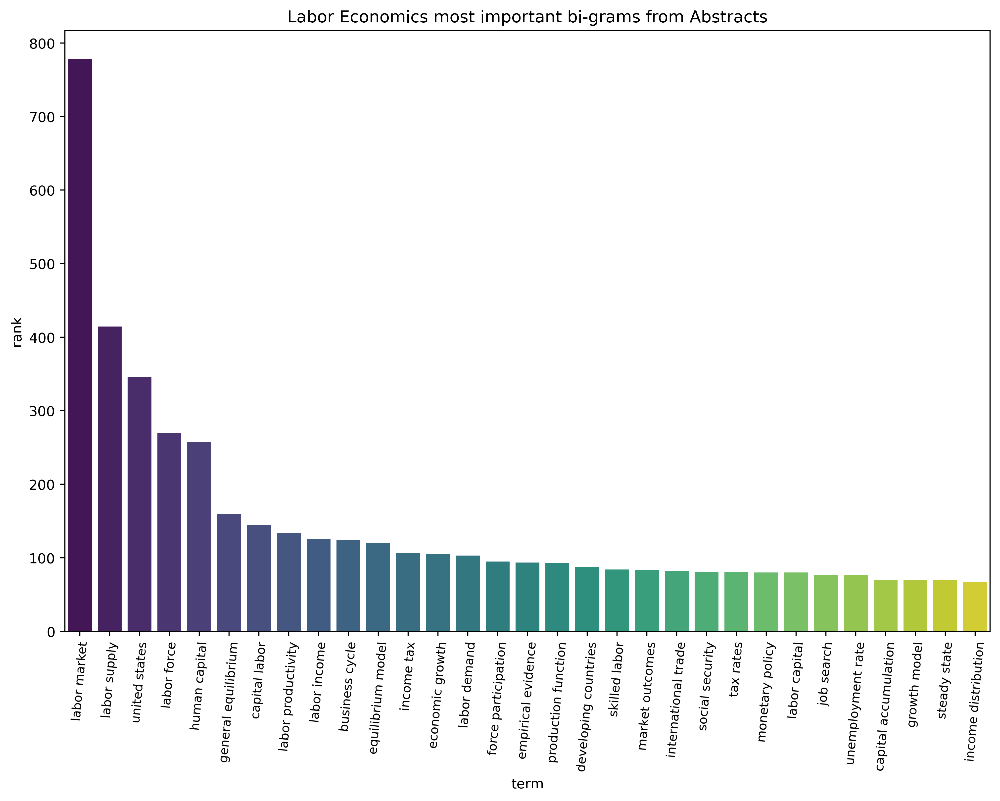

In [30]:
 # Getting top ranking features
sums = abstracts_tfidf.sum(axis = 0)
data1 = []
for col, term in enumerate(features_abstracts):
    data1.append((term, sums[0, col]))
ranking = pd.DataFrame(data1, columns = ['term', 'rank'])
words = (ranking.sort_values('rank', ascending = False))
print("\n\nMost relevant bi-grams \n", words.head(50))
plt.figure(figsize=(12,8), dpi=400)
sns.barplot(x="term", y="rank", data=ranking.loc[ranking['term'].isin(['business cycle',
       'capital accumulation', 'capital labor','developing countries', 'economic growth',
       'empirical evidence', 'equilibrium model','force participation', 'general equilibrium',
       'growth model', 'human capital', 'income distribution',
       'income tax', 'international trade', 'job search', 'labor capital',
       'labor demand', 'labor force', 'labor income', 'labor market',
       'labor productivity', 'labor supply',
       'market outcomes', 'monetary policy', 'production function',
       'skilled labor', 'social security', 'steady state',
       'tax rates','unemployment rate', 'united states'])].sort_values('rank', ascending = False), palette = 'viridis')
plt.title("Labor Economics most important bi-grams from Abstracts")
plt.xticks(fontsize=9, rotation=85);
plt.yticks(fontsize=10);

In [31]:
ranking['term'].unique()

array(['abstract paper', 'also find', 'business cycle',
       'capital accumulation', 'capital labor', 'cross section',
       'data set', 'developing countries', 'economic growth',
       'empirical evidence', 'equilibrium model', 'find evidence',
       'firm level', 'force participation', 'general equilibrium',
       'growth model', 'human capital', 'income distribution',
       'income tax', 'international trade', 'job search', 'labor capital',
       'labor demand', 'labor force', 'labor income', 'labor market',
       'labor markets', 'labor productivity', 'labor supply',
       'level data', 'life cycle', 'long run', 'long term',
       'market outcomes', 'model labor', 'monetary policy', 'panel data',
       'paper analyzes', 'paper develops', 'paper examines',
       'paper investigates', 'paper presents', 'paper studies',
       'per capita', 'percentage points', 'production function',
       'results indicate', 'results show', 'results suggest', 'short run',
       'skille

In [32]:
ranking.loc[ranking['term'].isin(['business cycle',
       'capital accumulation', 'capital labor','developing countries', 'economic growth',
       'empirical evidence', 'equilibrium model','force participation', 'general equilibrium',
       'growth model', 'human capital', 'income distribution',
       'income tax', 'international trade', 'job search', 'labor capital',
       'labor demand', 'labor force', 'labor income', 'labor market',
       'labor productivity', 'labor supply',
       'market outcomes', 'monetary policy', 'production function',
       'skilled labor', 'social security', 'steady state',
       'tax rates','unemployment rate', 'united states'])].sort_values('rank', ascending = False)

,term,rank
25,labor market,778.097674
28,labor supply,414.502968
57,united states,346.044726
23,labor force,270.000084
16,human capital,257.822464
14,general equilibrium,159.845736
4,capital labor,144.704181
27,labor productivity,134.207960
24,labor income,125.899661
2,business cycle,124.029809


In [33]:
#tf_idf_abstracts = pd.DataFrame.sparse.from_spmatrix(abstracts_tfidf, columns=vectorizer_abstracts.get_feature_names())
tf_idf_abstracts = pd.DataFrame(data=abstracts_tfidf.toarray(),columns=vectorizer_abstracts.get_feature_names())
tf_idf_abstracts.shape

(6870, 59)

In [34]:
tf_idf_abstracts.columns

Index(['abstract paper', 'also find', 'business cycle', 'capital accumulation', 'capital labor', 'cross section', 'data set', 'developing countries', 'economic growth', 'empirical evidence', 'equilibrium model', 'find evidence', 'firm level', 'force participation', 'general equilibrium', 'growth model', 'human capital', 'income distribution', 'income tax', 'international trade', 'job search', 'labor capital', 'labor demand', 'labor force', 'labor income', 'labor market', 'labor markets', 'labor productivity', 'labor supply', 'level data', 'life cycle', 'long run', 'long term', 'market outcomes', 'model labor', 'monetary policy', 'panel data', 'paper analyzes', 'paper develops', 'paper examines', 'paper investigates', 'paper presents', 'paper studies', 'per capita', 'percentage points', 'production function', 'results indicate', 'results show', 'results suggest', 'short run', 'skilled labor', 'social security', 'steady state', 'tax rate', 'tax rates', 'time series',
       'unemployment

In [35]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
scaled_X = scaler.fit_transform(tf_idf_abstracts)

In [36]:
from sklearn.decomposition import PCA

In [37]:
explained_variance = []

for n in range(1,tf_idf_abstracts.shape[1]+1):
    pca = PCA(n_components=n)
    pca.fit(scaled_X)
    explained_variance.append(np.sum(pca.explained_variance_ratio_))

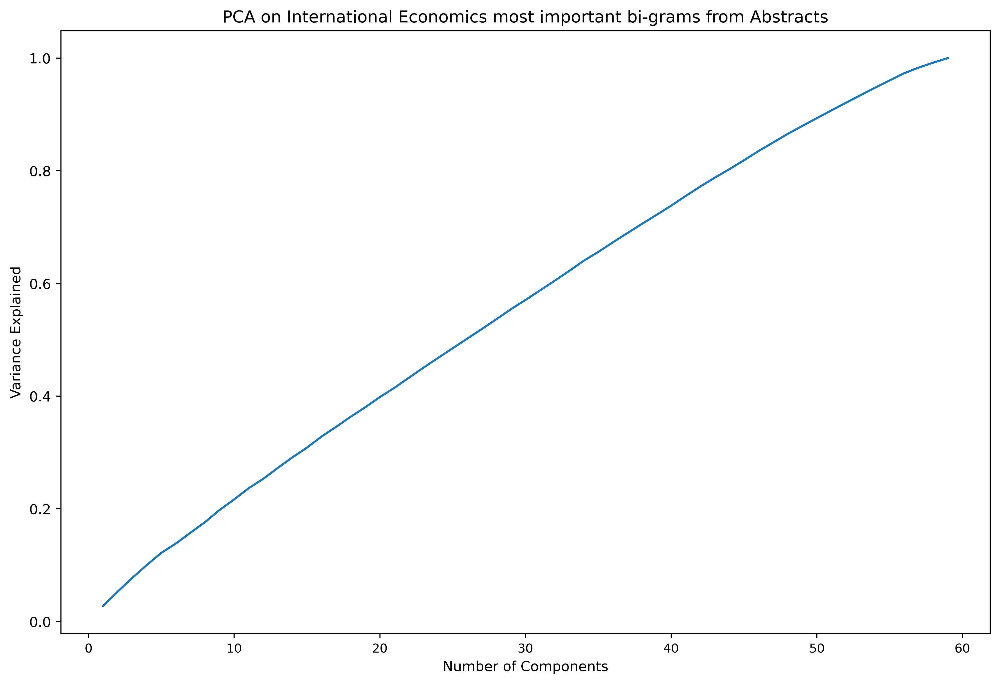

In [38]:
plt.figure(figsize=(12,8), dpi=400)
plt.plot(range(1,tf_idf_abstracts.shape[1]+1),explained_variance)
plt.title("PCA on International Economics most important bi-grams from Abstracts")
plt.xticks(fontsize=9);
plt.yticks(fontsize=10);
plt.xlabel("Number of Components")
plt.ylabel("Variance Explained");

In [39]:
interesting_columns = ['business cycle',
       'capital accumulation', 'capital labor','developing countries', 'economic growth',
       'empirical evidence', 'equilibrium model','force participation', 'general equilibrium',
       'growth model', 'human capital', 'income distribution',
       'income tax', 'international trade', 'job search', 'labor capital',
       'labor demand', 'labor force', 'labor income', 'labor market',
       'labor productivity', 'labor supply',
       'market outcomes', 'monetary policy', 'production function',
       'skilled labor', 'social security', 'steady state',
       'tax rates','unemployment rate', 'united states']

In [40]:
tf_idf_abstracts = tf_idf_abstracts[interesting_columns]
tf_idf_abstracts.shape

(6870, 31)

{'1': Text(-0.0007365824328887966, 0.12925258051462518, '1'),
 '2': Text(-0.037107378183243576, -0.23443208399181595, '2'),
 '3': Text(-0.08637858630023015, 0.4795103033539086, '3'),
 '4': Text(0.3192337956123061, 0.10089567117109365, '4'),
 '5': Text(-0.14575319582911114, 0.21272251080853474, '5'),
 '6': Text(0.36089102810890644, 0.3007026235092443, '6'),
 '7': Text(0.375549604231026, 0.1679501988391208, '7'),
 '8': Text(0.0788597103086602, 0.018336333804803876, '8'),
 '9': Text(0.22522123120664422, 0.39637400058211403, '9'),
 '10': Text(-0.09835979701108359, -0.08910514509040028, '10'),
 '11': Text(-0.4650497396263447, 0.2917652178022858, '11'),
 '12': Text(-0.26063545275809846, 0.2821926427128537, '12'),
 '13': Text(0.3924996866388297, 0.01964403816996863, '13'),
 '14': Text(0.14549808847900172, -0.17428827655065765, '14'),
 '15': Text(-0.1191164931911781, -0.20987652067863302, '15'),
 '16': Text(-0.4192224852022221, -0.09478933020950446, '16'),
 '17': Text(0.26962501305312275, 0.26

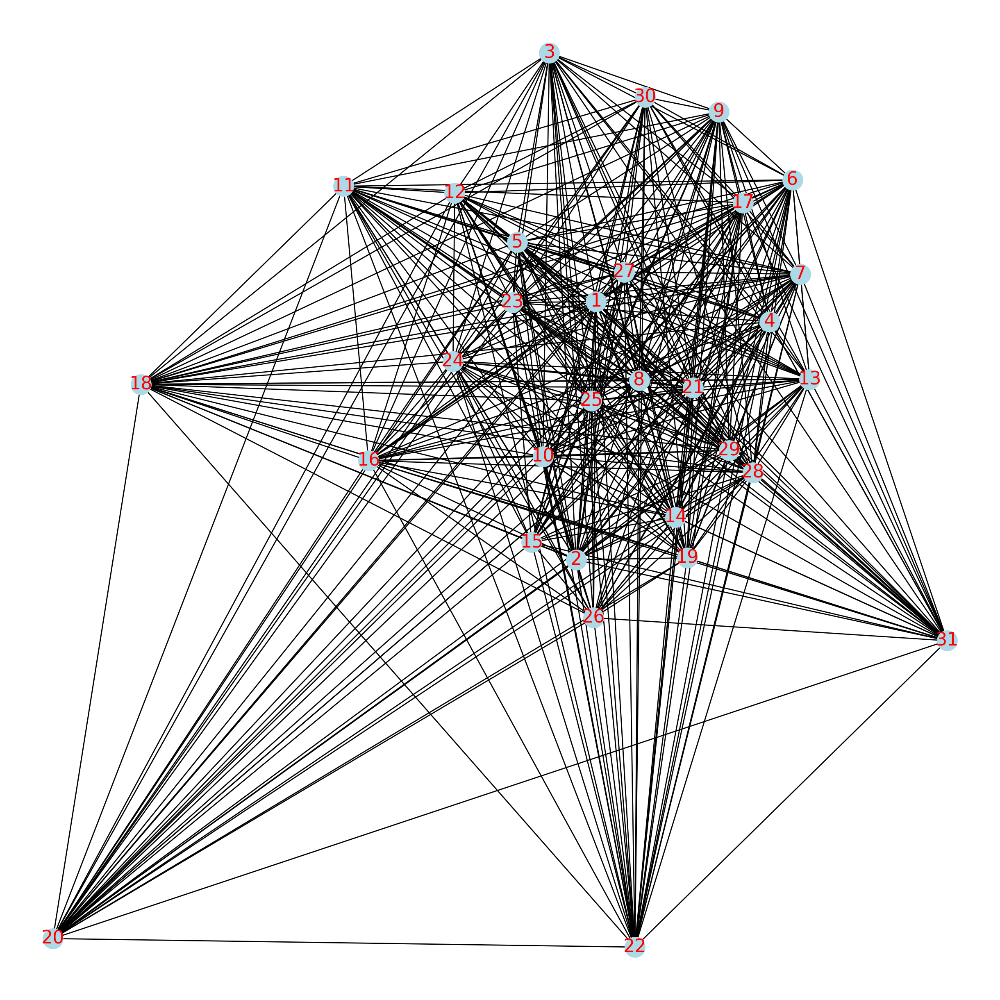

In [41]:
tf_idf_abstracts_2 = tf_idf_abstracts.rename({'business cycle':'1',
       'capital accumulation':'2', 'capital labor':'3','developing countries':'4', 'economic growth':'5',
       'empirical evidence':'6', 'equilibrium model':'7','force participation':'8', 'general equilibrium':'9',
       'growth model':'10', 'human capital':'11', 'income distribution':'12',
       'income tax':'13', 'international trade':'14', 'job search':'15', 'labor capital':'16',
       'labor demand':'17', 'labor force':'18', 'labor income':'19', 'labor market':'20',
       'labor productivity':'21', 'labor supply':'22',
       'market outcomes':'23', 'monetary policy':'24', 'production function':'25',
       'skilled labor':'26', 'social security':'27', 'steady state':'28',
       'tax rates':'29','unemployment rate':'30', 'united states':'31'}, axis='columns')
meta_matrix = tf_idf_abstracts_2.transpose().dot(tf_idf_abstracts_2)
G=nx.from_pandas_adjacency(meta_matrix)
plt.figure(figsize=(12,12), dpi=200)
nx.draw(G, pos=nx.kamada_kawai_layout(G), node_color='lightblue')
#nx.draw_networkx_nodes(G, pos=nx.kamada_kawai_layout(G), node_color="tab:red")
nx.draw_networkx_labels(G, pos=nx.kamada_kawai_layout(G), font_size=16, font_color="red")

In [42]:
centrality_time_series = []
count = 0 

# andare di anno in anno
for i in range(0, len(place_holder)-1):
    if(place_holder[i+1]-place_holder[i] > 1):
        count += 1
        meta_matrix = tf_idf_abstracts.iloc[place_holder[i]:place_holder[i+1]+1,:].transpose().dot(tf_idf_abstracts.iloc[place_holder[i]:place_holder[i+1]+1,:])
        G=nx.from_pandas_adjacency(meta_matrix)
        centrality_time_series = centrality_time_series + list(nx.degree_centrality(G).values())
        #clustering_time_series = clustering_time_series + list(nx.clustering(G).values())

In [43]:
centrality_time_series = np.reshape(centrality_time_series,(count,tf_idf_abstracts.shape[1]))
df_centrality_time_series = pd.DataFrame(data=centrality_time_series, columns=interesting_columns)
df_centrality_time_series['year'] = ""
df_centrality_time_series['year'] = interesting_years
#df_centrality_time_series.to_csv('centrality_time_series_abstracts_bigrams_international.csv')

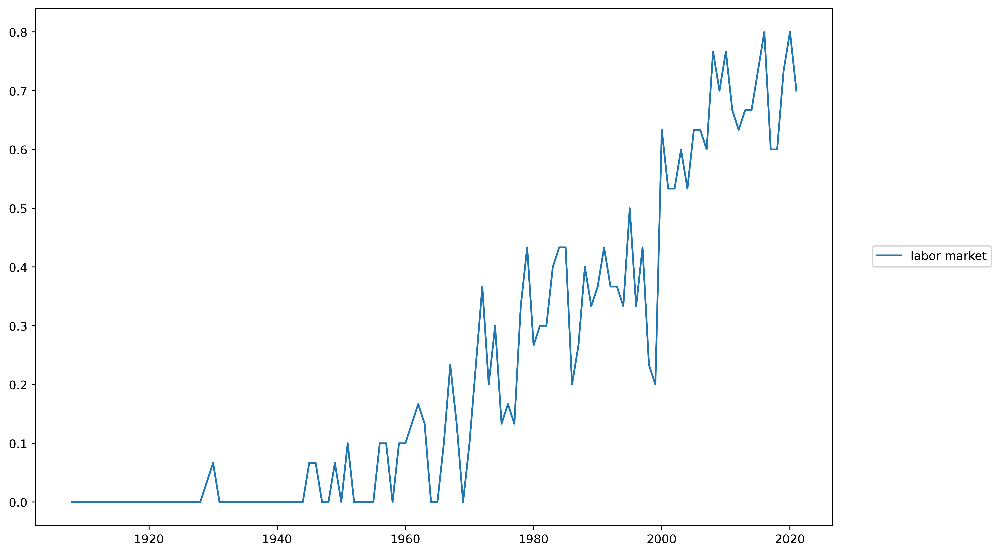

In [44]:
plt.figure(figsize=(12,8), dpi=400)
plt.plot(df_centrality_time_series['year'],df_centrality_time_series['labor market'], label = "labor market")
plt.legend(loc=(1.05,0.5))

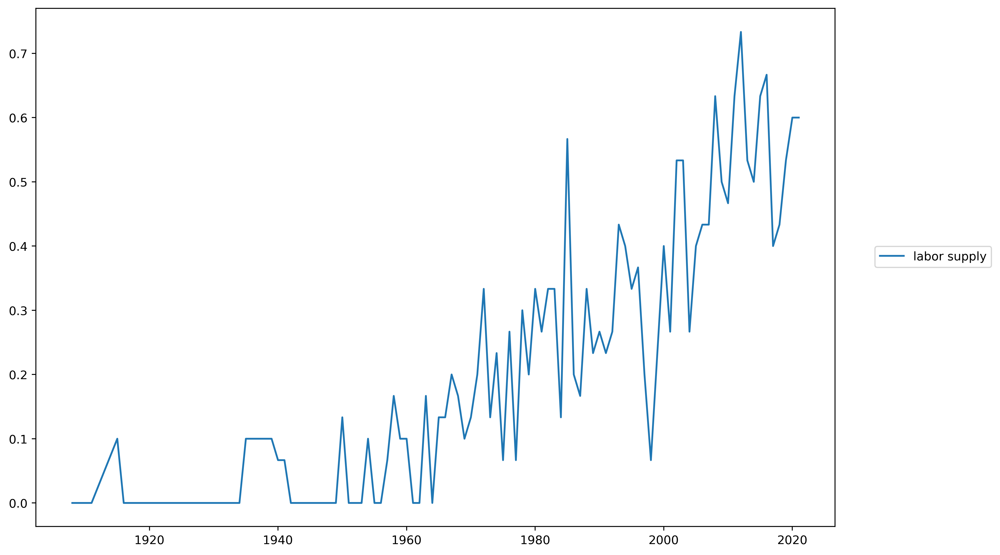

In [45]:
plt.figure(figsize=(12,8), dpi=400)
plt.plot(df_centrality_time_series['year'],df_centrality_time_series['labor supply'], label = "labor supply")
plt.legend(loc=(1.05,0.5))

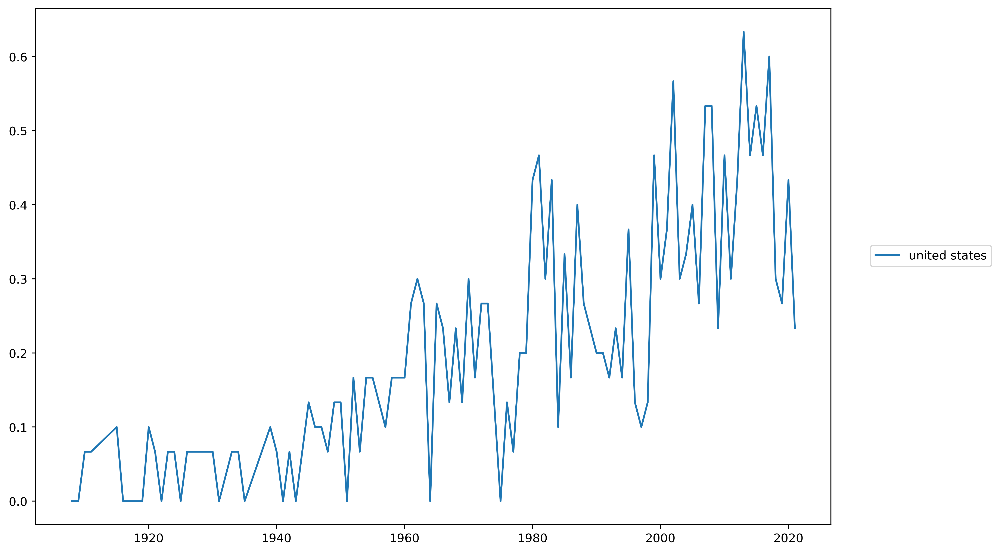

In [46]:
plt.figure(figsize=(12,8), dpi=400)
plt.plot(df_centrality_time_series['year'],df_centrality_time_series['united states'], label = "united states")
plt.legend(loc=(1.05,0.5))

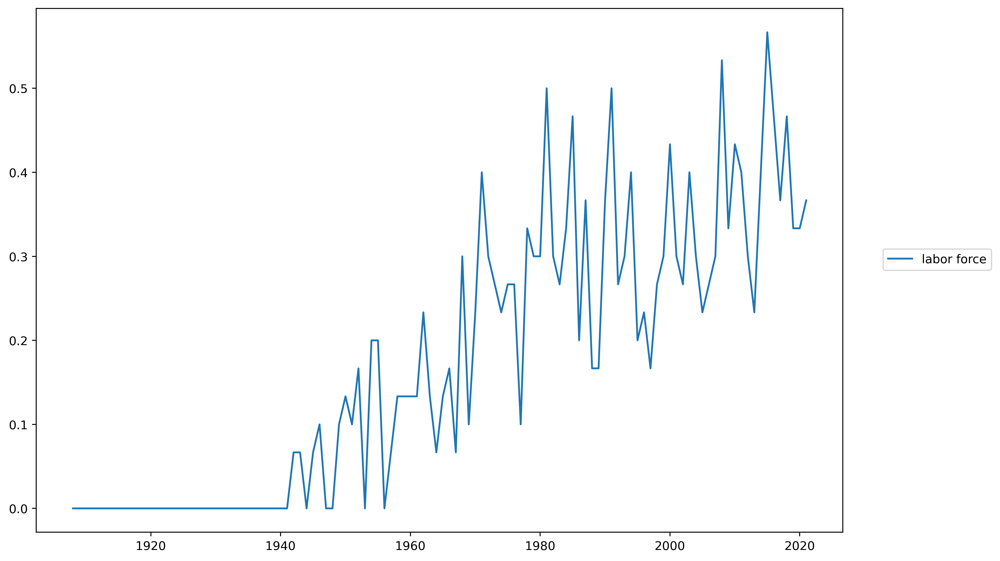

In [47]:
plt.figure(figsize=(12,8), dpi=400)
plt.plot(df_centrality_time_series['year'],df_centrality_time_series['labor force'], label = "labor force")
plt.legend(loc=(1.05,0.5))

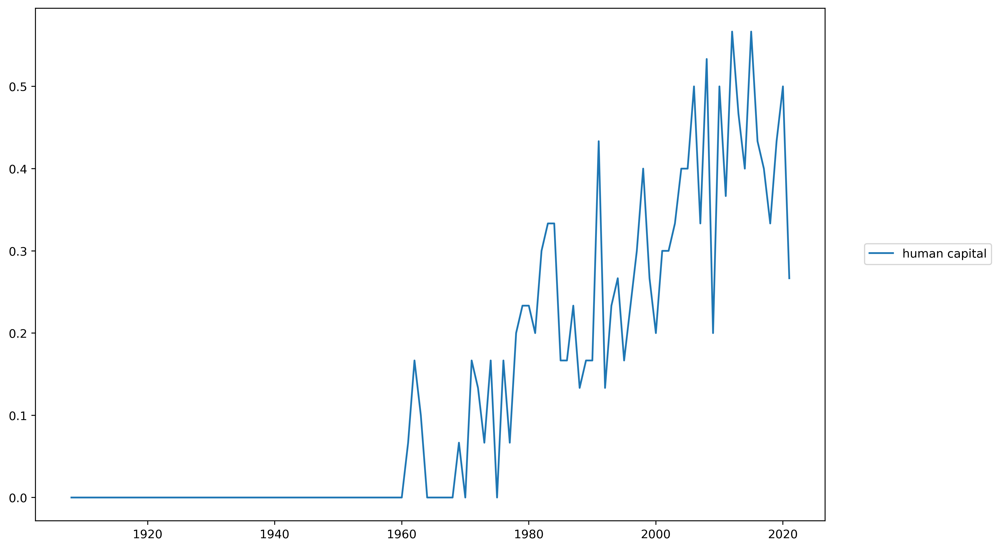

In [48]:
plt.figure(figsize=(12,8), dpi=400)
plt.plot(df_centrality_time_series['year'],df_centrality_time_series['human capital'], label = "human capital")
plt.legend(loc=(1.05,0.5))

In [49]:
df.to_csv('labor_cleaned.csv')

<ipython-input-50-a24d40afe3e2>:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(12,8), dpi=400)


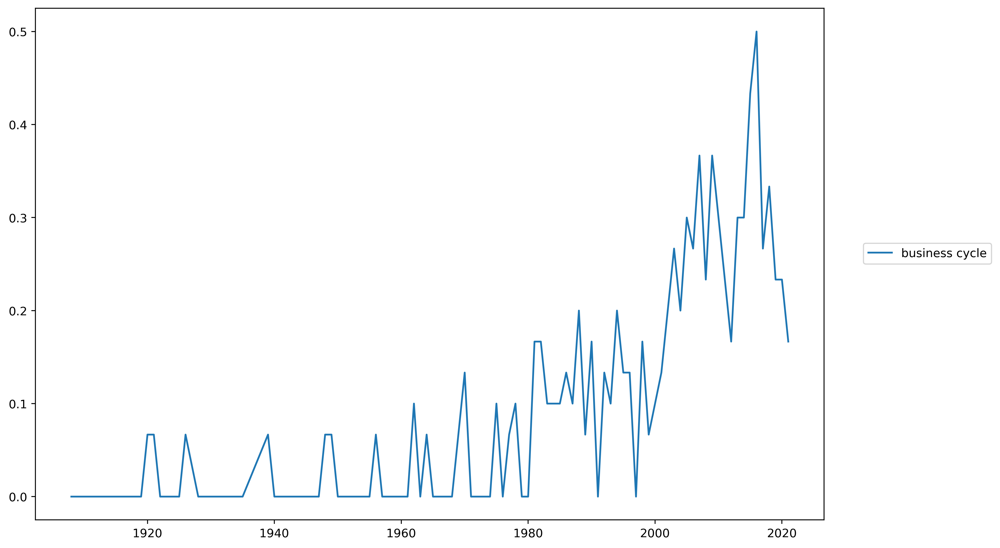

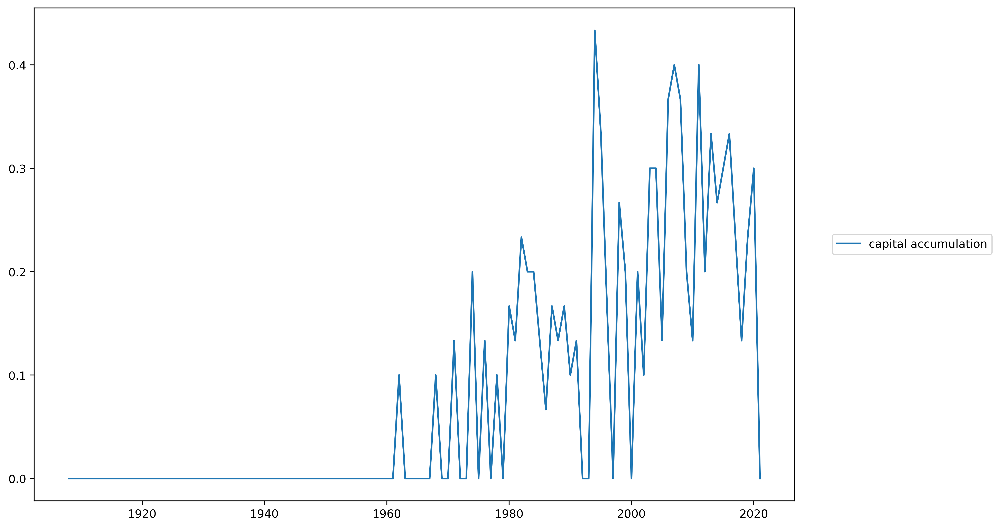

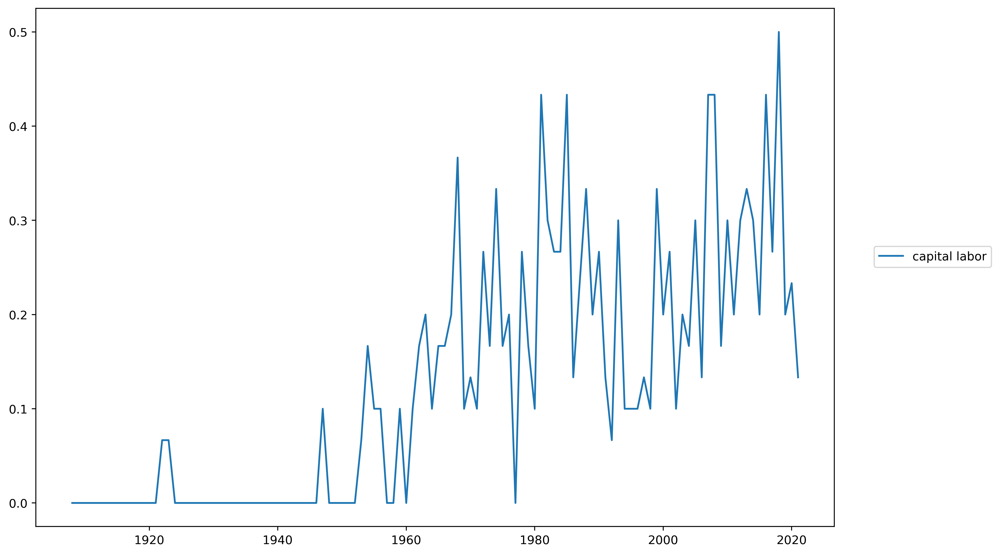

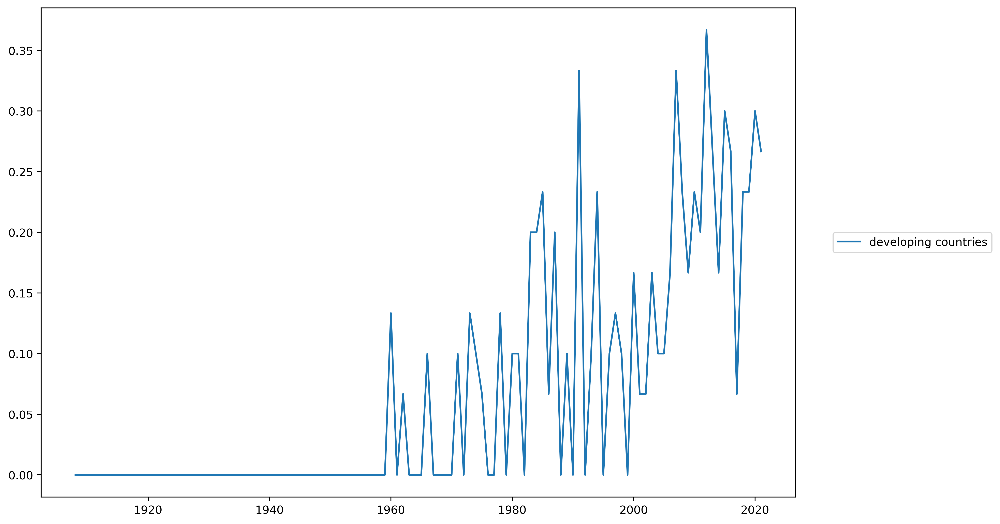

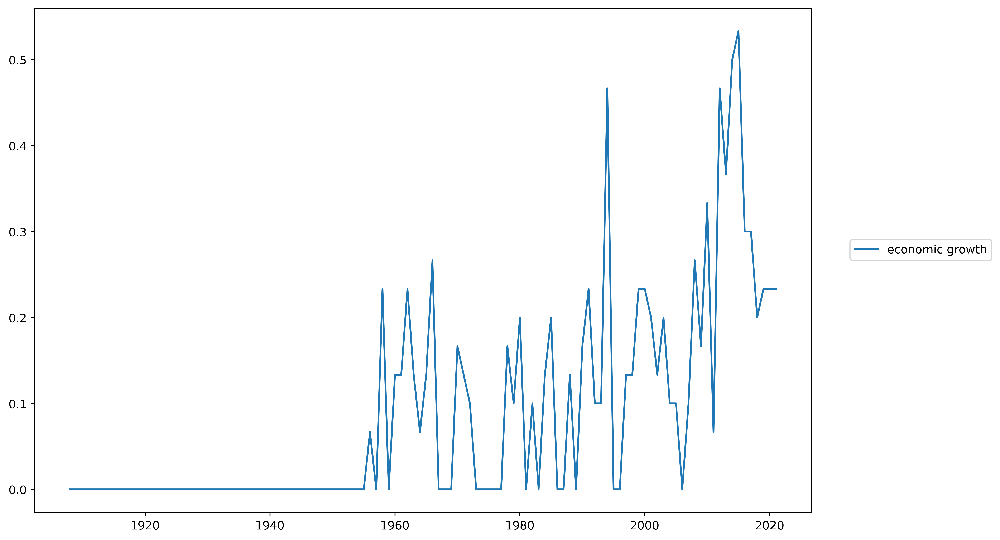

...

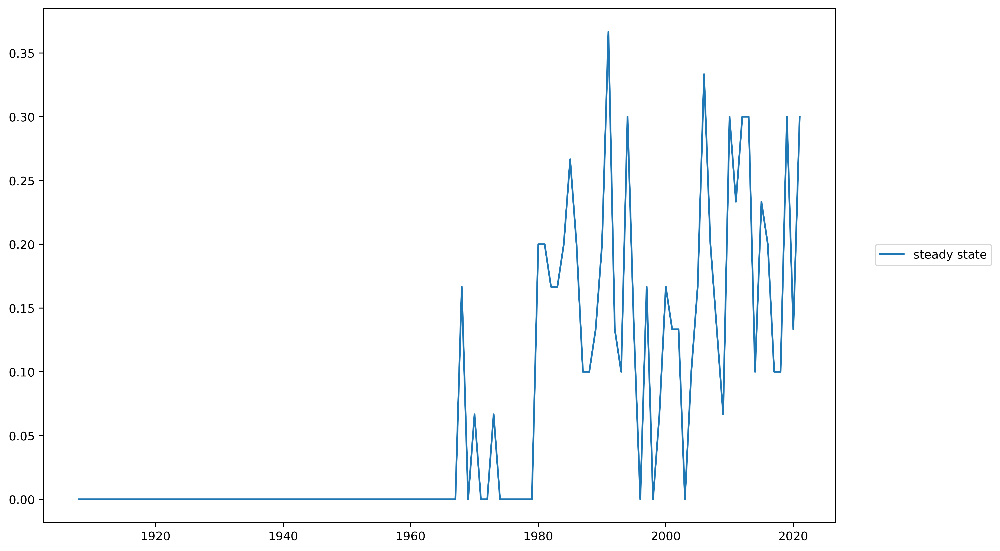

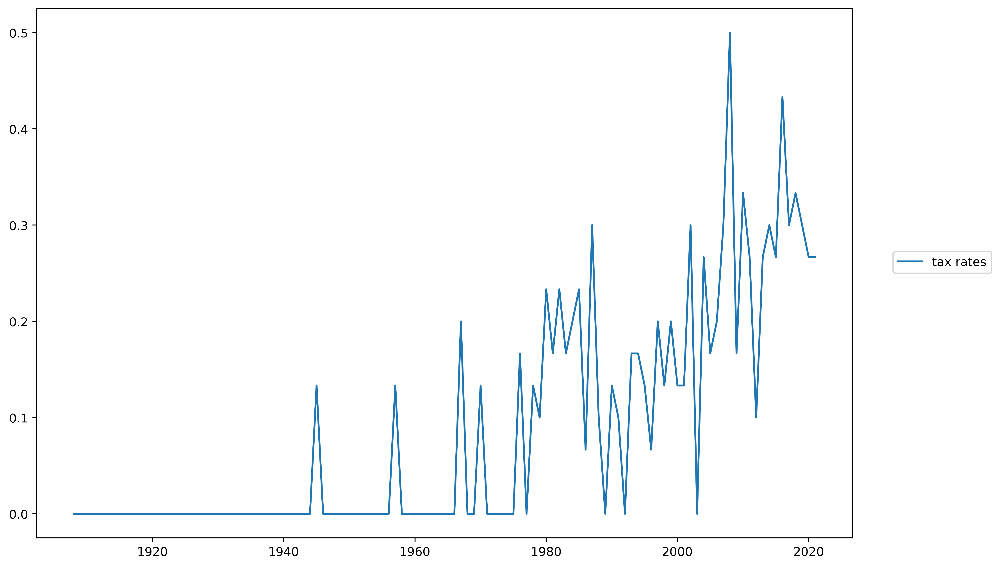

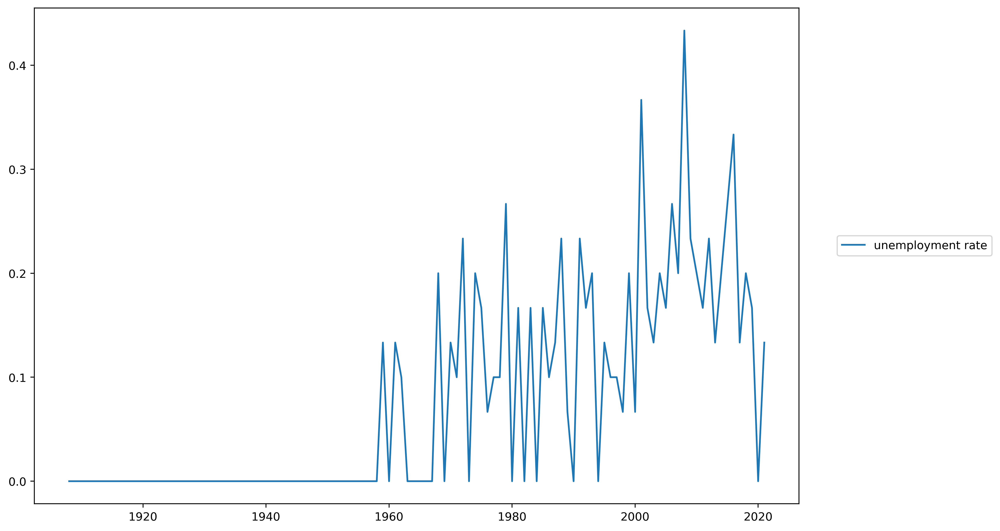

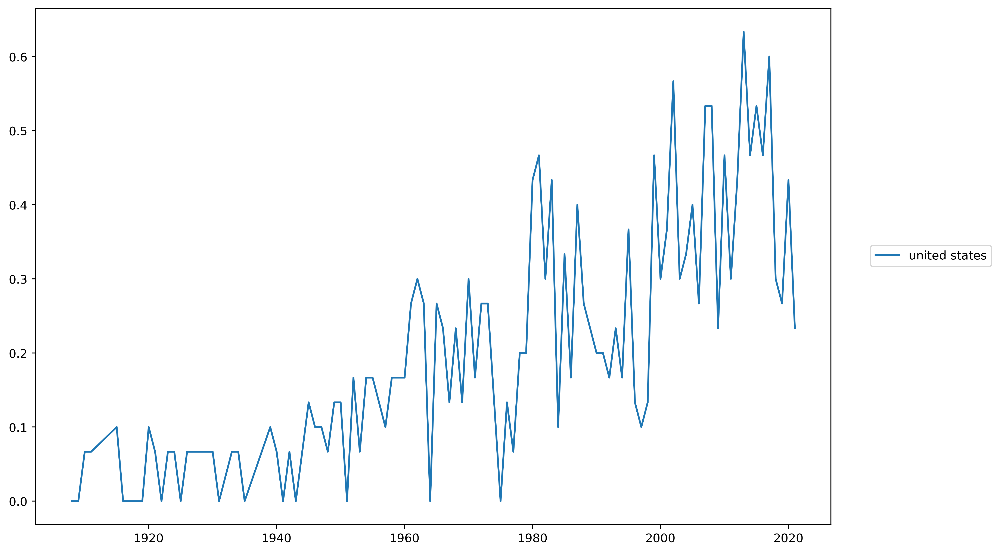

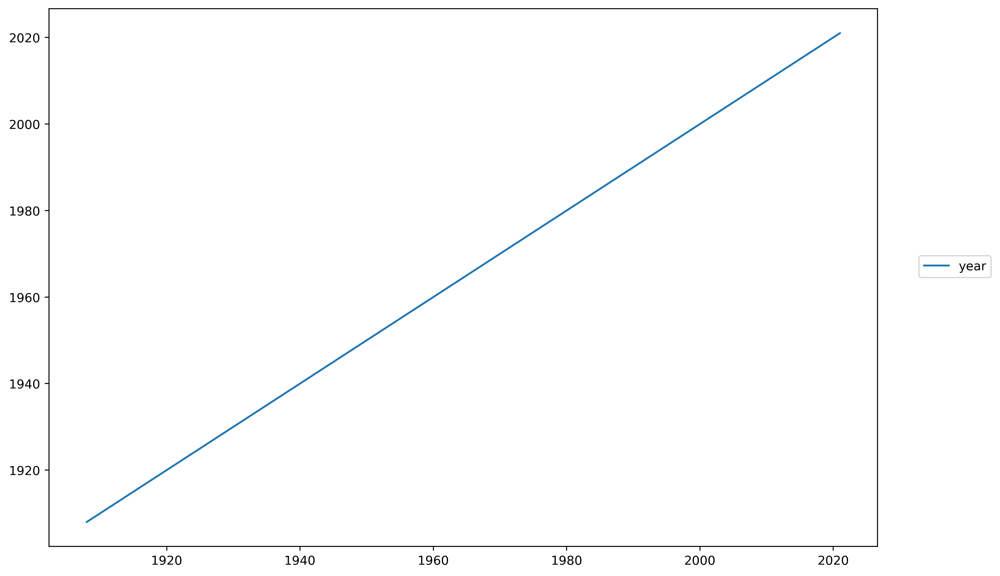

In [50]:
for feature in df_centrality_time_series:
    plt.figure(figsize=(12,8), dpi=400)
    plt.plot(df_centrality_time_series['year'],df_centrality_time_series[feature], label = feature)
    plt.legend(loc=(1.05,0.5))